## Selenium 라이브러리
`selenium`은 파이썬을 이용해 웹 브라우저를 조작할 수 있는 자동화 프레임워크!  
<br><br>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/9/9f/Selenium_logo.svg/2560px-Selenium_logo.svg.png" width="300">

<br><br>

### 0-1. Selenium 설치

In [1]:
%pip install selenium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.4/981.4 kB 10.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.0/359.0 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 1.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


### 0-2. Web Driver
웹 브라우저와 연동을 위해서는 **웹 브라우저를 제어**할 수 있는 프레임워크인 `WebDriver`가 필요!<br>
<u>크롬</u> web driver를 관리하는 라이브러리 `webdriver-manager` 설치
<br><br>
\* 이 실습은 크롬 기반임.

In [3]:
%pip install webdriver-manager

Note: you may need to restart the kernel to use updated packages.


### 1. Selenium 불러오기
우선 selenium을 불러온다. 

In [5]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager

### 2. 모듈 webdriver애서 Chrome() 객체를 생성한다.

In [8]:
driver= webdriver.Chrome(service= Service(ChromeDriverManager().install()))

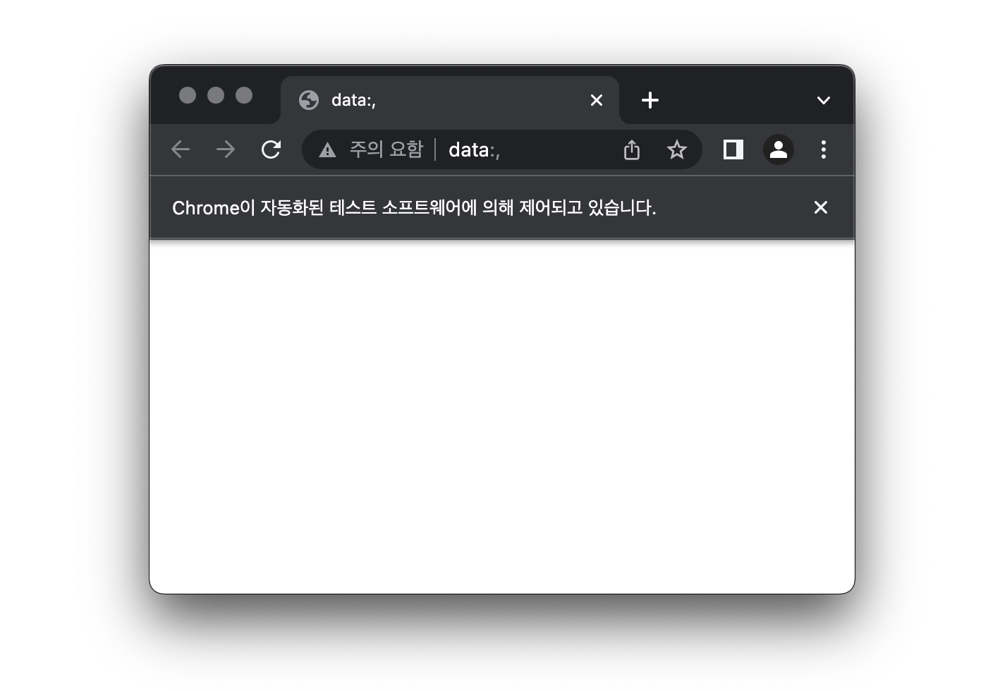
갑자기 크롬이 실행되었다면, 정상!  
위의 명령을 통해 웹 브라우저를 실행하고 파이썬과 연동 할 수 있게됨.

### 3. 요청 보내기 
`.get(<url>)` 


In [10]:
driver.get("http://www.example.com")

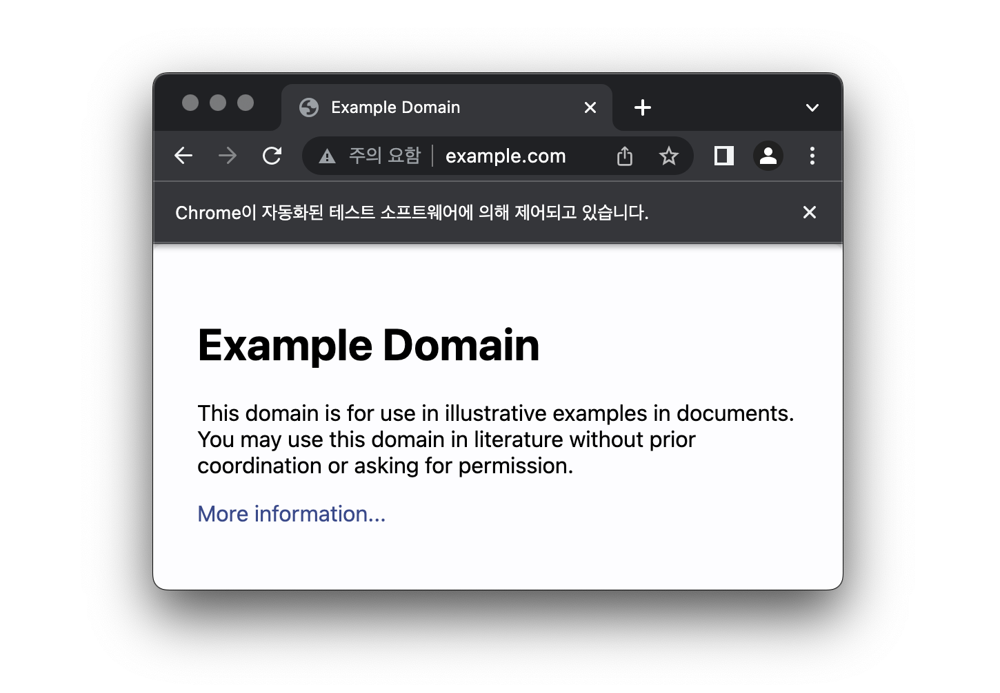
응답을 받았다. 

### 3-1. 페이지 속성 확인
`page_source` 통해 응답의 HTML 문서를 확인할 수 있다. 

In [11]:
print(driver.page_source)

<html><head>
    <title>Example Domain</title>

    <meta charset="utf-8">
    <meta http-equiv="Content-type" content="text/html; charset=utf-8">
    <meta name="viewport" content="width=device-width, initial-scale=1">
    <style type="text/css">
    body {
        background-color: #f0f0f2;
        margin: 0;
        padding: 0;
        font-family: -apple-system, system-ui, BlinkMacSystemFont, "Segoe UI", "Open Sans", "Helvetica Neue", Helvetica, Arial, sans-serif;
        
    }
    div {
        width: 600px;
        margin: 5em auto;
        padding: 2em;
        background-color: #fdfdff;
        border-radius: 0.5em;
        box-shadow: 2px 3px 7px 2px rgba(0,0,0,0.02);
    }
    a:link, a:visited {
        color: #38488f;
        text-decoration: none;
    }
    @media (max-width: 700px) {
        div {
            margin: 0 auto;
            width: auto;
        }
    }
    </style>    
</head>

<body>
<div>
    <h1>Example Domain</h1>
    <p>This domain is for use in illustr

### + 크롬 창 끄기 `with-as`
프로그램들을 실행하다 보면 크롬이 계속! 켜져있게 됨. 내가 해당 창을 끄라고 한적이 없기 때문이야!<br>
`with-as` 구문 사용해 주어진 명령이 끝나면 driver를 종료하도록 설정할 수 있다. <br>

```
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver: 
    ...
    ...
    ...
```
for문 처럼 명령이 끝나면 종료!

In [13]:
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("http://www.example.com")
    print(driver.page_source)


<html><head>
    <title>Example Domain</title>

    <meta charset="utf-8">
    <meta http-equiv="Content-type" content="text/html; charset=utf-8">
    <meta name="viewport" content="width=device-width, initial-scale=1">
    <style type="text/css">
    body {
        background-color: #f0f0f2;
        margin: 0;
        padding: 0;
        font-family: -apple-system, system-ui, BlinkMacSystemFont, "Segoe UI", "Open Sans", "Helvetica Neue", Helvetica, Arial, sans-serif;
        
    }
    div {
        width: 600px;
        margin: 5em auto;
        padding: 2em;
        background-color: #fdfdff;
        border-radius: 0.5em;
        box-shadow: 2px 3px 7px 2px rgba(0,0,0,0.02);
    }
    a:link, a:visited {
        color: #38488f;
        text-decoration: none;
    }
    @media (max-width: 700px) {
        div {
            margin: 0 auto;
            width: auto;
        }
    }
    </style>    
</head>

<body>
<div>
    <h1>Example Domain</h1>
    <p>This domain is for use in illust

-----
### 4. Driver에서 특정 요소 추출하기
selenium은 받아온 응답으로부터 특정 요소를 추출할 수도 있다.  
이미 **브라우저를 활용**하기 때문!
<br><br>
응답을 가지고 있는 driver 료소에 대해 다음과 같은 메서드를 적용할 수 있다. 
<br><br>
**요소 하나 찾기** ` .find_element(by, target)`<br> 
**요소 여러개 찾기** ` .find_elements(by, target)`<br>
- *by* : 대상을 찾는 기준 e.g., *ID*, *TAG_NAME*, *CLASS_NAME*,...
- *target* : 대상의 속성
<br><br>

#### 4-0. By import



In [17]:
from selenium.webdriver.common.by import By

#### 4-1. p태그 요소 하나 찾아보기

In [19]:
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("http://www.example.com")
    print(driver.find_element(By.TAG_NAME, "p").text)


This domain is for use in illustrative examples in documents. You may use this domain in literature without prior coordination or asking for permission.


이 문서에서 p태그는 2개 있음.<br>
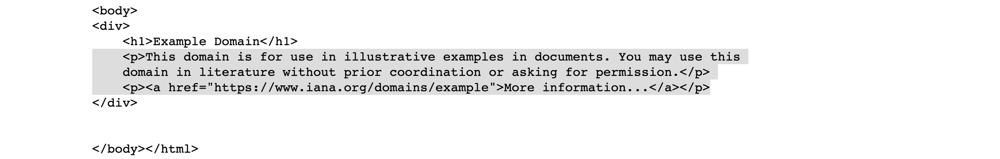
<br><br>
요소를 하나만 찾았기 때문에 위에 있는 p태그 내용이 출력!
<br><br>
#### 4-2. p태그 요소 모두 찾아보기

In [21]:
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("http://www.example.com")
    print(driver.find_elements(By.TAG_NAME, "p").text)

AttributeError: 'list' object has no attribute 'text'

find elements는 list로 반환하기 때문에 text로 바로 반환해 줄 수 없다!

In [22]:
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("http://www.example.com")
    for element in driver.find_elements(By.TAG_NAME, "p"):
        print("txt: ", element.text)


txt:  This domain is for use in illustrative examples in documents. You may use this domain in literature without prior coordination or asking for permission.
txt:  More information...


-----
### 5. 동적 웹 사이트 스크래핑 : Wait & Call
### Implicit / Explicit Wait
Selenium은 동적 웹 사이트에 대한 지원을 진행하기 위해 **명시적 기다림 (Explicit Wait)**과 **암묵적 기다림 (Implicit Wait)**을 지원한다.
- Implicit Wait : 전부 로딩이 될 때 까지 **지정한 시간** 동안 기다림  

    <span style="color: royalblue"> e.g., 다 로딩 될 때 까지 5초 기다려!🐕 </span>
<br>
 
- Explicit Wait : **특정 요소에 대한 제약** 통한 기다림  

    <span style="color: royalblue"> e.g., 이 태그 다 가져올 때 까지 5초 기다려!🐕 </span>
<br><br><br>

<span style="font-size: 20px">
IndieStreet 이벤트 스크래핑 
</span>
<br><br>
다음 사이트에 있는 행사의 이름들을 스크래핑 해본다 : https://indistreet.com/live?sortOption=startDate%3AASC  

해당 페이지는 공연 리스트가 담긴 웹 페이지  



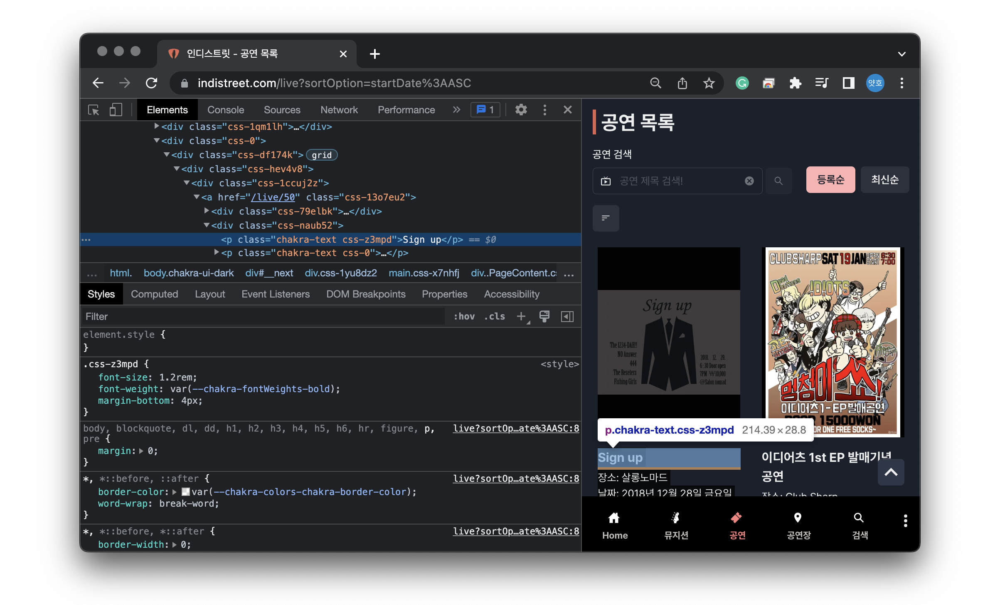

우리가 타겟으로 하는 행사 제목이 html의 어떤 구조 안에 들어있는지 파악하기 위하여 '개발자도구 - 검사' 진행!  

여기서 주목해야할 것은 class이름이 '<span style="color:orange">css-</span>'과 '<span style="color:orange">random txt</span>'로 이루어져 있다는 것!  

이는 class 이름이 특정되면 스크래핑이 너무 쉬워지기 때문에, 최근 개발자들이 보안상 class를 **ranomized** 하게 지정해줌.  

그러나 **구조**는 **불변**하기 때문에 **구조 중심의 스크래핑**을 해야할 것!  

   --> **<span style="font-size: 16px">XPath</span>**가 도와줄거야

<br><br>


### + XPath
스크래핑을 방지할 목적으로 랜덤하게 class이름을 생성한 페이지의 경우, 특정 태그 이용해 스크래핑은 어려움.  

이 경우 쓸 수 있는 방법은 여러가지지만,  

그 중 하나는 **위치**를 활용한 방법이 있음.  

`XPath`는 XML. HTML 문서 등의 요소의 위치를 경로로 표현하는 것을 의미함.  
<span style="color: gray"> like `/Users/jiwookim/Music/p;ㅠ.mp3`!</span>  
<br>
**<span style="font-size:20px">🍯</span> Tip!** XPath는 경로를 원하는 `항목의 우클릭 - Copy - CopyXPath`를 하여 쉽게 복사해올 수 있다.
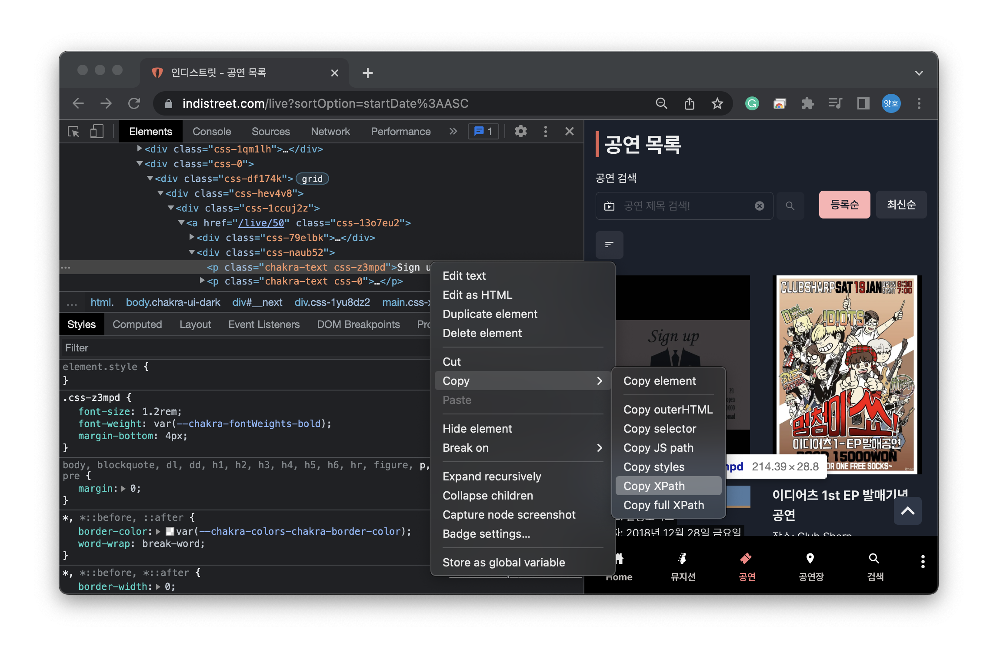



**Hint** 여기서 원하는 요소의 XPath는 `//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[1]/div/a/div[2]/p[1]`

<br><br><br>

#### 5-0. 스크래핑에 필요한 라이브러리 불러오기

In [23]:
# from selenium import webdriver
# from selenium.webdriver.chrome.service import Service
# from selnium.webdriver.common.by import By
# from webdriver_manager.chrome import ChromeDriverManager

#### 5-1. 예시 사이트에 요청을 진행하고, 사이트의 첫 번째 이벤트 제목을 가져오기

In [25]:
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("https://indistreet.com/live?sortOption=startDate%3AASC")
    driver.find_element(By.XPATH,'//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[1]/div/a/div[2]/p[1]').text
    

NoSuchElementException: Message: no such element: Unable to locate element: {"method":"xpath","selector":"//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[1]/div/a/div[2]/p[1]"}
  (Session info: chrome=103.0.5060.134)
Stacktrace:
0   chromedriver                        0x00000001068daef9 chromedriver + 4480761
1   chromedriver                        0x00000001068665d3 chromedriver + 4003283
2   chromedriver                        0x00000001064f9338 chromedriver + 410424
3   chromedriver                        0x000000010652f5bd chromedriver + 632253
4   chromedriver                        0x000000010652f841 chromedriver + 632897
5   chromedriver                        0x00000001065617d4 chromedriver + 837588
6   chromedriver                        0x000000010654ca8d chromedriver + 752269
7   chromedriver                        0x000000010655f4f1 chromedriver + 828657
8   chromedriver                        0x000000010654c953 chromedriver + 751955
9   chromedriver                        0x0000000106522cd5 chromedriver + 580821
10  chromedriver                        0x0000000106523d25 chromedriver + 584997
11  chromedriver                        0x00000001068ac02d chromedriver + 4288557
12  chromedriver                        0x00000001068b11b3 chromedriver + 4309427
13  chromedriver                        0x00000001068b623f chromedriver + 4330047
14  chromedriver                        0x00000001068b1dfa chromedriver + 4312570
15  chromedriver                        0x000000010688afef chromedriver + 4153327
16  chromedriver                        0x00000001068cbd78 chromedriver + 4418936
17  chromedriver                        0x00000001068cbeff chromedriver + 4419327
18  chromedriver                        0x00000001068e2ab5 chromedriver + 4512437
19  libsystem_pthread.dylib             0x00007ff80f5e74e1 _pthread_start + 125
20  libsystem_pthread.dylib             0x00007ff80f5e2f6b thread_start + 15


<span style="color:red">ERR!</span>  
오류가 발생하였다.  

이 페이지는 **동적 웹페이지**이기 때문에, **비동기 처리**를 하기 때문에 **데이터 없음**이 문제되었다.  

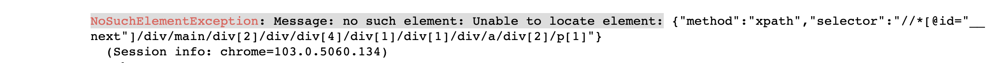  

이러한 경우, `Wait`을 이용하여 데이터가 충분히 로드 될 수 있도록 기다려주어야 한다.  
<br><br>
두 가지 Wait 방법: 
- Implicit Wait
- Explicit Wait  

을 활용해 스크래핑 해본다.  
<br><br>
#### i. Implicit Wait

`.implicitly_wait(t)`  

<span style="color:gray">이때, 반드시 해당 시간을 기다리는 것이 아니라, 한계 시간을 의미함! 그 전에 로딩이 다 된다면 그만 기달</span>  

In [27]:
#10초간 implicit wait 진행해본다. 
from selenium.webdriver.support.ui import WebDriverWait


with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("https://indistreet.com/live?sortOption=startDate%3AASC")
    driver.implicitly_wait(10)
    print(driver.find_element(By.XPATH,'//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[1]/div/a/div[2]/p[1]').text)
    


Sign up


#### ii. Explicit Wait

`WebDriverWait()`과 메서드 `.until()` 또는 `.until_not()` 활용해 명시적 기다림 적용할 수 있음.  

- `until()` : 인자의 조건이 만족될 때 까지 계속!
- `.until_not()` : 인자의 조건이 만족되지 않는 한 계속!  

**example**  

id가 `target`인 요소가 존재할 때 까지 기다린 후 다음 명령을 진행해라! (단, 10초 까지만 기달려줌) 

````
element = WebDriverWait(driver, 10).until(EC.presence_of_element_located((By.ID, "target")))
````

이 때, EC는 `expected_conditions`로, selenium에서 정의된 조건들! (~가 존재하면,..)


In [41]:
from selenium.webdriver.support import expected_conditions as EC

with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:
    driver.get("https://indistreet.com/live?sortOption=startDate%3AASC")
    result = WebDriverWait(driver,10).until(EC.presence_of_element_located((By.XPATH,'//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[1]/div/a/div[2]/p[1]')))
    print(result.text)


Sign up


#### 5-2. 여러 공연 제목 가져오기
공연의 제목마다 위치가 다르니까 XPath가 다를 것..!  

그러나 전체적으로 동일한 구조가 gridy하기 때문에, 병렬적으로 들어갈 것이다.   

따라서 XPath에도 어떤 규칙성이 있을 것이라고 생각해 볼 수 있다.  

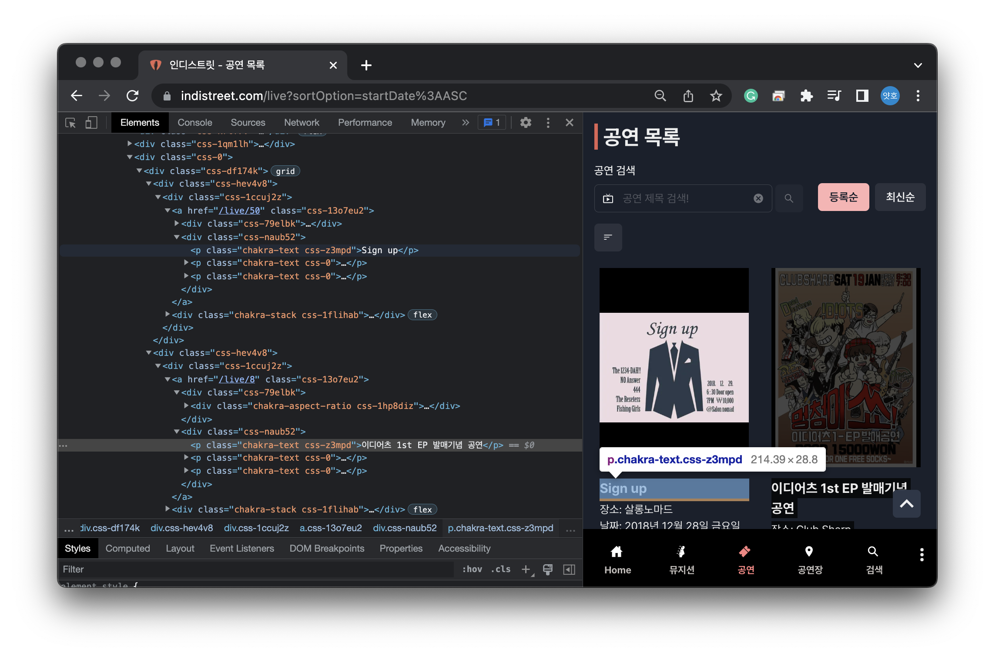
<br>

따라서 몇 가지 공연 제목들의 XPath를 살펴본다.  
```
//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[1]/div/a/div[2]/p[1]
//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[2]/div/a/div[2]/p[1]
//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[3]/div/a/div[2]/p[1]
```
<br><br>
모두 동일한 규칙을 가지고 있을 것이라 전제하고, 가장 먼저 등장하는 10개만 추출해보자!

In [48]:
with webdriver.Chrome(service= Service(ChromeDriverManager().install())) as driver:

    driver.get("https://indistreet.com/live?sortOption=startDate%3AASC")
    driver.implicitly_wait(10)
    
    events=[]
    for i in range(1,11): 
        result = driver.find_element(By.XPATH,'//*[@id="__next"]/div/main/div[2]/div/div[4]/div[1]/div[{}]/div/a/div[2]/p[1]'.format(i))
        events.append(result.text)

In [49]:
events

['Sign up',
 '이디어츠 1st EP 발매기념 공연',
 '도라페스트 4탄',
 'NO PASARAN! Vol.1',
 'LIVE in NOV 2019',
 'LIVE in DEC 2019',
 '오롯한 라이브와 함께',
 'LIVE in FEB',
 '2020 PUNK Marathon',
 'THE LIGHTS']

### 6. 마우스 이벤트 처리 
<br><br>
<span style="font-size: 18px">
해시코드 "로그인"창 접속하기
</span>

: 해시코드라는 사이트에 로그인하기 위해 "로그인 버튼"을 눌러보자! https://hashcode.co.kr/  

로그인 과정을 자동화 하는 것을 목표로 한다.  
<br><br>
### Mouse Event 🐭

웹 페이지에서 일어나는 일들을 Event라고 한다.  

마우스로 일어날 수 있는 대표적 이벤트는 
- 마우스 움직이기 (move)
- 마우스 누르기 (press down)
- 마우스 떼기 (press up)
- ...  

<span style="color: royalblue">
더 많은 이벤트들과 설명은 셀레늄 공식 문서 (https://www.selenium.dev/documentation/webdriver/actions_api/mouse/)에서..!  
</span>
<br><br>
  
여기서는 **버튼을 찾은** 후, 이를 **클릭**하는 것이 목표!  

마우스 입력은 크게 다음과 같은 과정 있음:
    
1. 입력하고자 하는 대상 요소를 찾는다. `find_element()`
2. 입력하고자 하는 내용을 `click` 통해 전달한다.
3. `.perform()` 통해 동작한다.  
<br><br>

<span style="color: gray">
<b>example</b>
id가 button인 요소를 클릭하기:  

````
button = driver.find_element(By.ID, "button") 
ActionChains(driver).clock(button).perform()
````
</span>

----
<br><br>
타겟으로 하는 '로그인'의 html 상 위치 찾기 위해 '개발자도구 - 검사' 진행한다.  

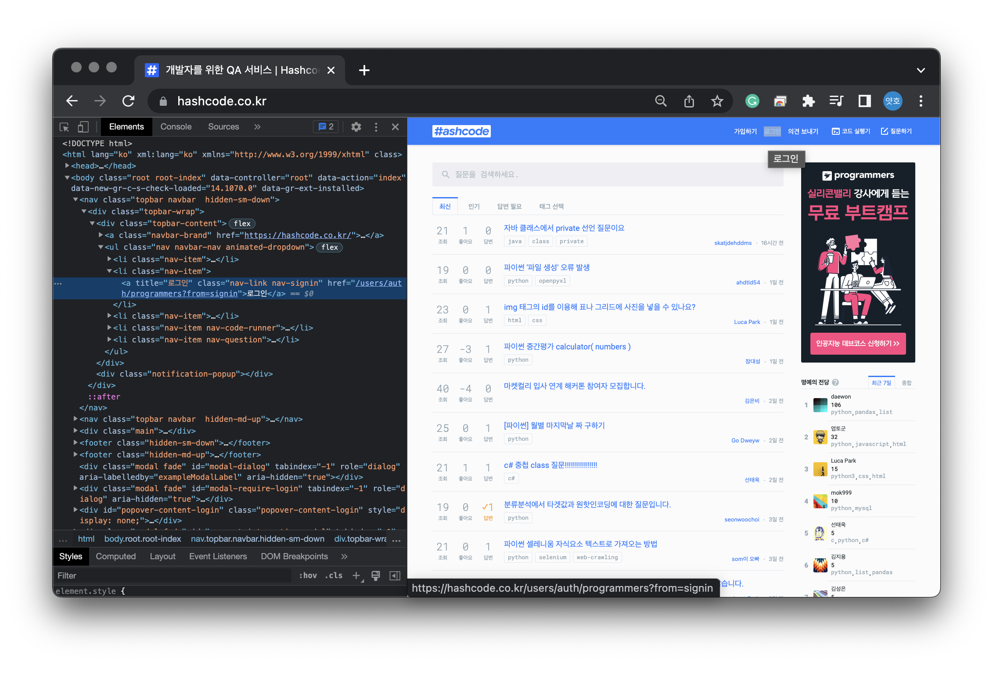

XPath는 `/html/body/nav[1]/div/div[1]/ul/li[2]/a`.  

여기서 class가 <span style="color:orange">nav-link</span>와 <span style="color:orange">nav-signin</span>, 두 개 이다.  

class를 두 개 이상 명시했을 때, class의 계층을 만들 수 있음..!  

이 경우 nav-link > nav-signin 인 class 계층.

<br><br><br>

#### 6-0. 라이브러리 불러오기

In [50]:
# from selenium import webdriver
from selenium.webdriver import ActionChains
# from selenium.chrome.service import Service
# from selenium.common.by import By
# from webdriver_manager.chrome import ChromeDriverManager


#### 6-1. 주어진 웹 사이트 누른 후, 원하는 버튼 요소를 찾아 마우스 이벤트 실행

In [78]:
driver= webdriver.Chrome(service= Service(ChromeDriverManager().install()))
driver.get("https://hashcode.co.kr/")    
driver.implicitly_wait(0.5)

button= driver.find_element(By.CLASS_NAME, "nav-link.nav-signin")
ActionChains(driver).click(button).perform()
    

로그인 페이지로 잘 이동한다!  
<br><br>

<img src="automatic_login.GIF" width="500">

<br><br>

### 7. 키보드 이벤트 처리  

### Keyboard Event  

키보드로 일어날 수 있는 대표적인 이벤트
- 키보드 누르기 (press down)
- 키보드 떼기 (press up)
- ...

<span style="color: royalblue">
더 많은 이벤트들과 설명은 셀레늄 공식 문서(https://www.selenium.dev/documentation/webdriver/actions_api/keyboard/)에서..!  
</span>
<br><br>

여기서 입력창 (`input`태그의 form)에 키보드 입력하는 것이 목표!  

키보드 입력은 크게 다음과 같은 과정 있음 :  

1. 입력하고자 하는 대상 요소 찾기 `find_element()`
2. 입력하고자 하는 내용을 `send_keys_to_element` 통해 전달
3. `.perform()` 통해 동작  

<br> 

<span style="color: gray">
<b>example</b>
id가 textInput 요소에 "abc" 입력하기:

````
text_input = driver.find_element(By.ID, "textInput") 
ActionChains(driver).send_keys_to_element(text_input, "abc").perform()
````
</span>

----  

여기서 진행해야 할 progress는,  

1. 이메일 입력창 찾는다. 
2. 입력한다.
3. 비밀번호 입력창 찾는다.
4. 입력한다.
5. '로그인하기' 버튼을 찾는다.
6. 누른다. 

<br> 

타겟으로 하는 '로그인' 입력 창의 html 상 위치 찾기 위해 '개발자도구 - 검사' 진행한다.  

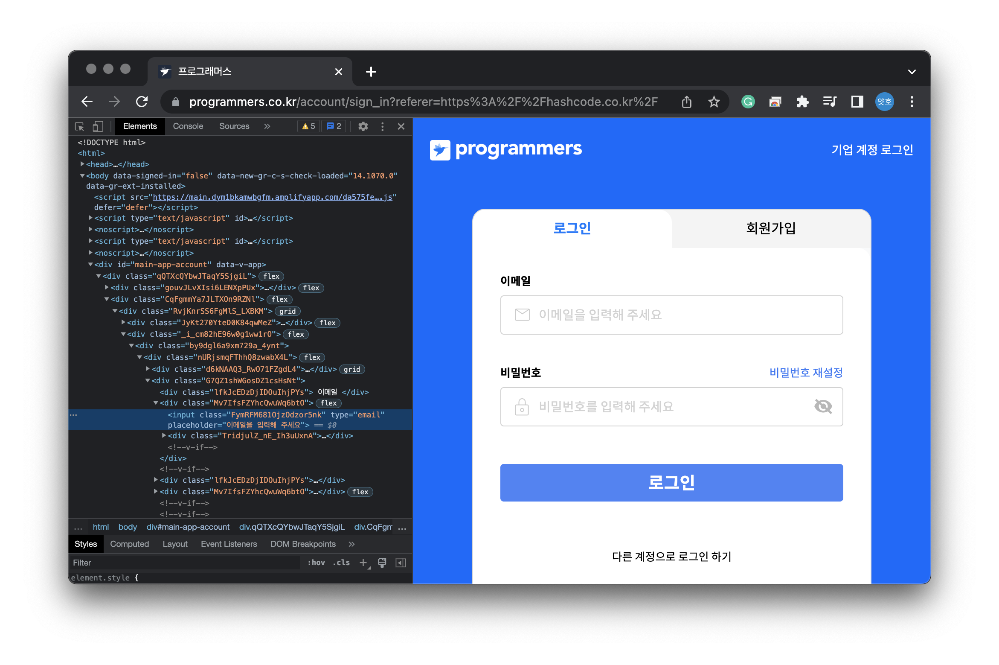  


강의 내용과 달리 class도 randomized name, id도 없어서 일단 id에 "user password" 입력해주었다.   

XPath 이용하는 편이 좋을 것 같다.  

일단 강의대로 츄라이츄라이!  



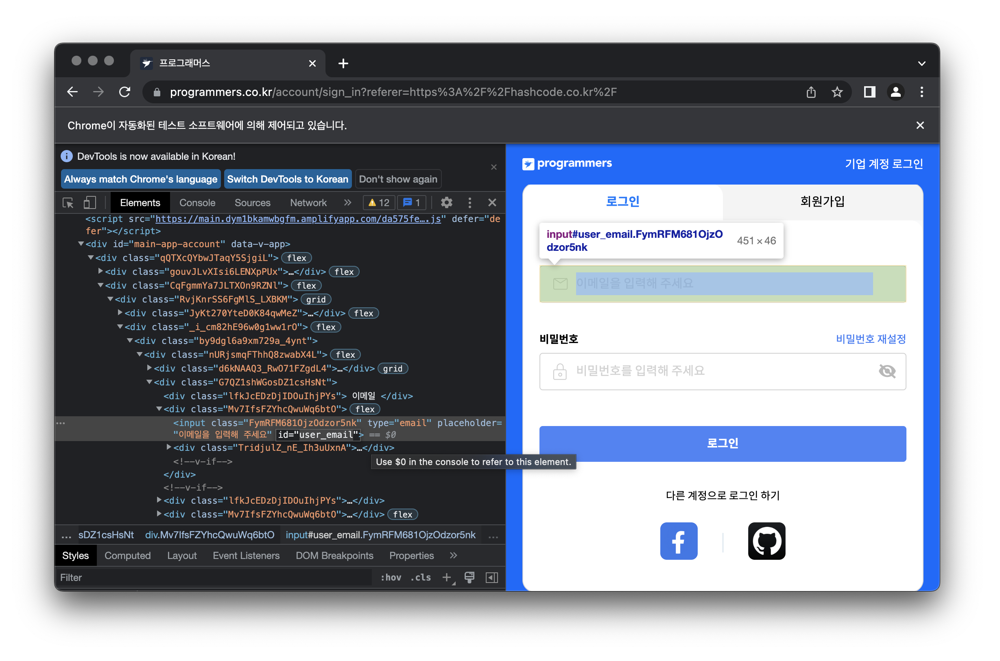
 


In [62]:
# mouse event 실습에 이어서 진행하기 위해, 다시 런.
import time

driver= webdriver.Chrome(service= Service(ChromeDriverManager().install()))
driver.get("https://hashcode.co.kr/")    
time.sleep(1)

button= driver.find_element(By.CLASS_NAME, "nav-link.nav-signin")
ActionChains(driver).click(button).perform()


#### 7-1. "아이디" input 요소에 나의 아이디 입력

In [63]:
id_input= driver.find_element(By.ID, "user_email")
ActionChains(driver).send_keys_to_element(id_input, "k_jiwoo6@naver.com").perform()

result:  

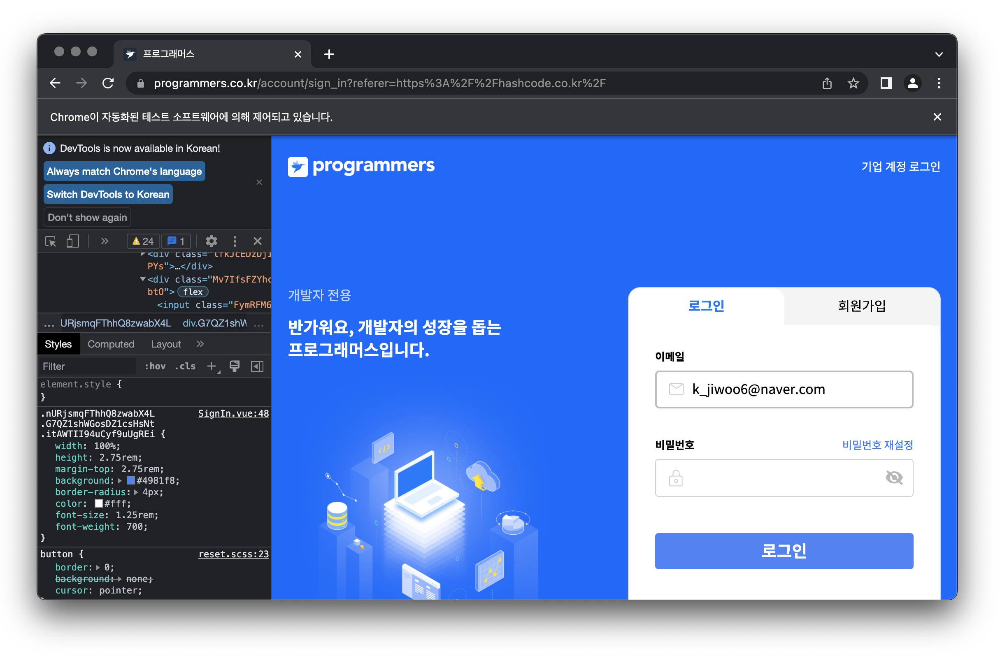  


#### 7-2. "패스워드" input 요소에 나의 패스워드 입력

In [64]:
pw_input= driver.find_element(By.ID, "user_password")
ActionChains(driver).send_keys_to_element(pw_input, "").perform()

result:  


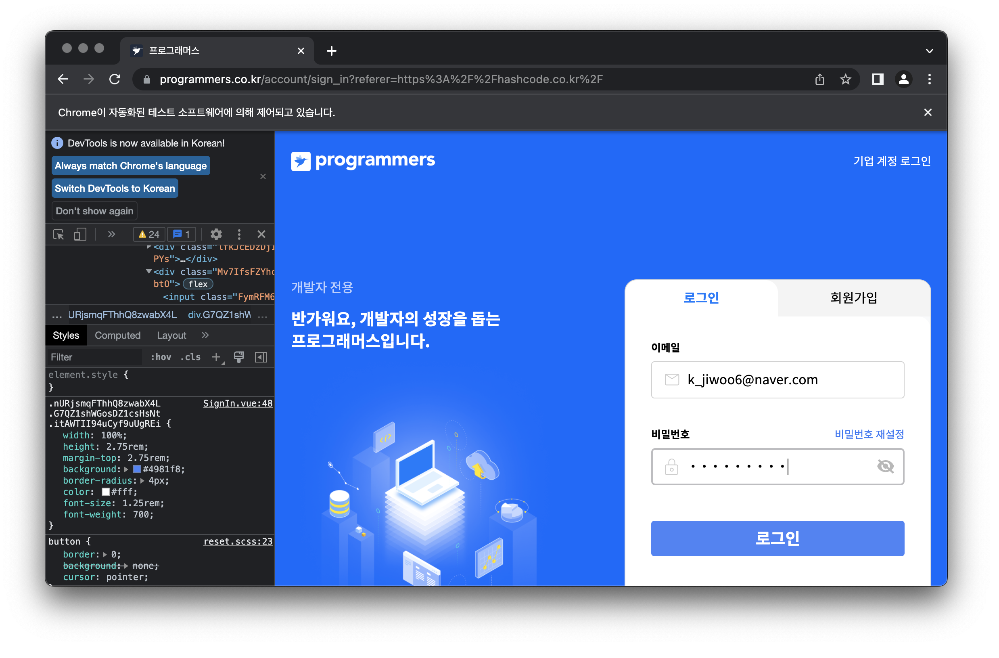

#### 7-3. 로그인 버튼 눌러 로그인 완료

In [66]:
login_button= driver.find_element(By.ID, "btn-sign-in")
ActionChains(driver).click(login_button).perform()

다란!
    
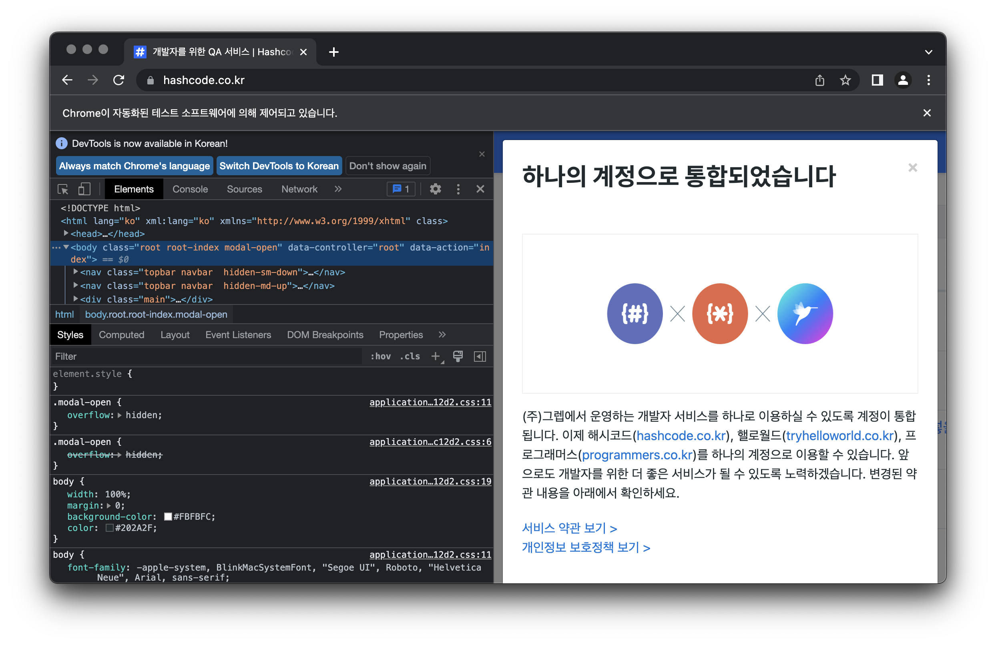 

**<span style="font-size:20px">🍯</span> Tip!** `time.sleep()`  

지금은 내가 기록하면서 진행하기 위해 코드의 단계 진행에 느릿해서  

별 다른 에러가 생기지 않았지만,  

이 코드를 오토메틱하게 돌리려면 중간중간 `time.sleep()` 걸어서 로그인 진행 단계에 인터벌을 주어야 한다!  

-----

### ++ Sign-in by XPath

위의 경우 class 이름이 전부다 randomized 되었다.  

뭔가 업데이트하면서 보안을 강화한 것 같다.  

배워먹은 좋은 기술 XPath 이용해 자동로긴 진행해본다.  

#### +0. 로그인 창에 진입

In [70]:
driver= webdriver.Chrome(service= Service(ChromeDriverManager().install()))
driver.get("https://hashcode.co.kr/")    
time.sleep(1)

button= driver.find_element(By.CLASS_NAME, "nav-link.nav-signin")
ActionChains(driver).click(button).perform()

#### +1. 이메일 입력칸, 패스워드 입력칸, 로그인 버튼의 XPath 얻어오기  

- email XPath : `//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/div[2]/input`  
- pw XPath    : `//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/div[4]/input`  
- Login btn XPath : `//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/button`

In [71]:
idXP= '//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/div[2]/input'
pwXP= '//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/div[4]/input'
siXP= '//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/button'

#### +2. 이메일 입력  

In [72]:
id_input= driver.find_element(By.XPATH, idXP)
ActionChains(driver).send_keys_to_element(id_input, "k_jiwoo6@naver.com").perform()

#### +3. 패스워드 입력

In [74]:
pw_input= driver.find_element(By.XPATH, pwXP)
ActionChains(driver).send_keys_to_element(pw_input, "").perform()

#### +4. 로그인 버튼 눌러 로그인 완료

In [75]:
login_button= driver.find_element(By.XPATH, siXP)
ActionChains(driver).click(login_button).perform()

-----
single-cell code👇

In [77]:
idXP= '//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/div[2]/input'
pwXP= '//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/div[4]/input'
siXP= '//*[@id="main-app-account"]/div/div[2]/div/div[2]/div[1]/div/div[2]/button'

driver= webdriver.Chrome(service= Service(ChromeDriverManager().install()))
driver.get("https://hashcode.co.kr/")    
time.sleep(1)

button= driver.find_element(By.CLASS_NAME, "nav-link.nav-signin")
ActionChains(driver).click(button).perform()
time.sleep(1)

id_input= driver.find_element(By.XPATH, idXP)
ActionChains(driver).send_keys_to_element(id_input, "k_jiwoo6@naver.com").perform()
time.sleep(1)

pw_input= driver.find_element(By.XPATH, pwXP)
ActionChains(driver).send_keys_to_element(pw_input, "").perform()
time.sleep(1)

login_button= driver.find_element(By.XPATH, siXP)
ActionChains(driver).click(login_button).perform()


result  
<br>

<img src="automatic_login_XPATH_blind.GIF" width="500">